### Project #2 - Group #6

#### Team Members:

* Name: Salma Khaled Hegazy - ID: **221002185**
* Name: Monier Ashraf Monier - ID: **221002188**
* Name: Tawfik Yasser Tawfik - ID: **221002143**

### Data Pre-Processing Step [Local]

We wanted to fix the file before working on it, to remove the `NumberInt()` attached with numbers in the file.

So we used the following commands and code snippets on our local machine:

- Step #1: Converting the JSON file into TEXT file in-order to remove the `NumberInt()`
```bash 
cat dblpv13.json >> data_1.txt
```
- Step #2: Replacing any `NumberInt()` with empty string.
```python 
  filename = "data_1.txt"
  filename_2 = "data_2.txt"
  with open(filename) as f, open(filename_2, "w") as f2:
      for line in f:
          f2.write(line.replace("NumberInt(", "").replace(")", ""))
```
- Step #3: Reading the data_2.txt as JSON file into two files each with 10,000 object (Publication)
```python
  import json
  objs = []
  with open('data_3.txt', 'r') as file:
      o = ''
      next_line_starts_with_brace = False
      for line in file:
          o += line
          if line.strip().endswith('},'):
              next_line_starts_with_brace = True
          elif next_line_starts_with_brace and line.startswith('{'):
              objs.append(o)
              o = ''
              next_line_starts_with_brace = False

          if len(objs) == 10000:
              break

  with open('p3.json', 'w') as file:
      file.write('[' +'\n')
      for obj in objs:
          if not obj.strip().startswith('{'):
              obj = "{"+obj.strip()[:-1].strip()[:-1]
          else:
              obj = obj.strip()[:-1].strip()[:-1]
          if "abstract" in json.loads(obj):
            file.write(obj+"," +'\n')
      file.write(']')
```

### Uploading/Partitioning Data to Spark

In [0]:
# Imports
import matplotlib.pyplot as plt
from pyspark.sql.functions import *
from pyspark.sql.types import ArrayType, StringType, StructType, StructField
import re
from pyspark.sql.window import Window
import requests

In [0]:
# Reading the datafile (p3.json is our initial data file)
df = spark.read.option("inferSchema", "true").option("multiline", "true").json("dbfs:/FileStore/tables/p3.json")
display(df)

_id,abstract,authors,doi,fos,isbn,issn,issue,keywords,lang,n_citation,page_end,page_start,pdf,references,title,url,venue,volume,year
53e99784b7602d9701f3e133,"Drought is the first place in all the natural disasters in the world. It is especially serious in North China Plain. In this paper, different soil water content control levels at winter wheat growth stages are performed on Gucheng Ecological-Meteorological Integrated Observation Experiment Station of CAMS, China. Some canopy parameters, including growth conditions, dry weight, physiological parameters and hyperspectral reflectance, are measured from erecting stage to milk stage for winter wheat in 2009. The relationship between canopy parameters and soil relative moisture, canopy water content and water indices of winter wheat are established. The results show that some parameters, such as SPAD and dry weight of leaves, decrease with the increasing of soil relative moisture, while other parameters, including dry weight of caudexes, above ground dry weight, height, photosynthesis rate, intercellular CO 2 concentration, stomatal conductance and transpiration rate, increase corresponding to the soil relative moisture. Obvious linear relationship between stomatal conductance and transpiration rate is established with 45 samples, which R2 reaches to 0.6152. Finally, the fitting equations between canopy water content and water indices are regressed with b5, b6 and b7 of MODIS bands. The equations are best with b7 and worst with b5. So the fitting equations with b7 can be used to inverse the canopy water content of winter wheat using MODIS or other remote sensing images with similar bands range to MODIS in Hebei Province. © 2011 IEEE.","List(List(53f45728dabfaec09f209538, null, null, null, Peijuan Wang, null, null, null, null, null, null, null, null, null), List(5601754345cedb3395e59457, null, null, null, Jiahua Zhang, null, null, null, null, null, null, null, null, null), List(53f38438dabfae4b34a08928, null, null, null, Donghui Xie, null, null, null, null, null, null, null, null, null), List(5601754345cedb3395e5945a, null, null, null, Yanyan Xu, null, null, null, null, null, null, null, null, null), List(53f43d25dabfaeecd6995149, null, null, null, Yun Xu, null, null, null, null, null, null, null, null, null))",10.1109/IGARSS.2011.6049503,"List(Agronomy, Moisture, Hydrology, Environmental science, Dry weight, Water content, Stomatal conductance, Transpiration, Irrigation, Soil water, Canopy)",,,null,"List(canopy parameters, canopy spectrum, different soil water content control, winter wheat, irrigation, hydrology, radiometry, moisture, indexes, vegetation, indexation, dry weight, soil moisture, water content, indexing terms, spectrum, natural disaster)",en,0,1933,1930,null,null,The relationship between canopy parameters and spectrum of winter wheat under different irrigations in Hebei Province.,List(http://dx.doi.org/10.1109/IGARSS.2011.6049503),"List(53a7297d20f7420be8bd4ae7, null, null, International Geoscience and Remote Sensing Symposium, null, null, null, IGARSS, null, null, null, null, 0)",null,2011
53e99784b7602d9701f3e151,,"List(List(53f46797dabfaeb22f542630, null, null, null, Jairo Rocha, null, null, null, null, null, null, null, null, null), List(54328883dabfaeb4c6a8a699, null, null, null, Theo Pavlidis, null, null, null, null, null, null, null, null, null))",10.1109/ICDAR.1993.395663,"List(Intelligent character recognition, Pattern recognition, Computer science, Feature (computer vision, Document processing, Handwriting recognition, Optical character recognition, Feature extraction, Feature (machine learning, Artificial intelligence, Intelligent word recognition)",,,,"List(handwriting recognition, prototypes, image segmentation, computer science, expert systems, knowledge base, pattern recognition, usability, optical character recognition, shape, feature extraction)",en,17,605,602,null,"List(53e99cf5b7602d97025ace63, 557e8a7a6fee0fe990caa63d, 53e9a96cb7602d97032c459a

In [0]:
df.count()

Out[3]: 9999

In [0]:
df.printSchema()

root
 |-- _id: string (nullable = true)
 |-- abstract: string (nullable = true)
 |-- authors: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- _id: string (nullable = true)
 |    |    |-- bio: string (nullable = true)
 |    |    |-- email: string (nullable = true)
 |    |    |-- gid: string (nullable = true)
 |    |    |-- name: string (nullable = true)
 |    |    |-- name_zh: string (nullable = true)
 |    |    |-- oid: string (nullable = true)
 |    |    |-- oid_zh: string (nullable = true)
 |    |    |-- orcid: string (nullable = true)
 |    |    |-- org: string (nullable = true)
 |    |    |-- org_zh: string (nullable = true)
 |    |    |-- orgid: string (nullable = true)
 |    |    |-- orgs: array (nullable = true)
 |    |    |    |-- element: string (containsNull = true)
 |    |    |-- sid: string (nullable = true)
 |-- doi: string (nullable = true)
 |-- fos: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- isbn: s

In [0]:
print("Partitions of the df : {0:,}".format(df.rdd.getNumPartitions()))

Partitions of the df : 1


In [0]:
df = df.repartition(4)

In [0]:
print("Partitions of the df : {0:,}".format(df.rdd.getNumPartitions()))

Partitions of the df : 4


### Transformations

In [0]:
# Dropping publications with one word title, and empty authors
df = df.filter((size(split(df['title'], ' ')) != 1) & (size(df['authors']) != 0))
df.count()

Out[8]: 5388

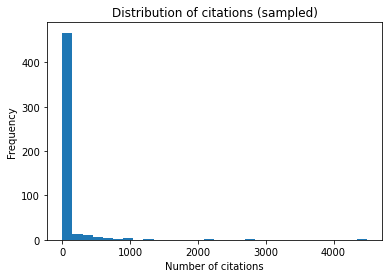

In [0]:
# Number of citations visualization
# df.select('n_citation').describe().show()
sampled_df = df.sample(fraction=0.1, seed=42)
citations = [int(c) for c in sampled_df.select('n_citation').rdd.flatMap(lambda x: x).collect() if c is not None]
plt.hist(citations, bins=30)
plt.xlabel('Number of citations')
plt.ylabel('Frequency')
plt.title('Distribution of citations (sampled)')
plt.show()

In [0]:
# ISSN Issue
# Since the ISSN and DOI are independent identifiers and each of them serves a specific goal, directly we cannot fix the ISSN with DOI
# We decided to drop the ISSN from the dataset.
df = df.drop(col('ISSN'))
display(df)

_id,abstract,authors,doi,fos,isbn,issue,keywords,lang,n_citation,page_end,page_start,pdf,references,title,url,venue,volume,year
53e99796b7602d9701f5d69e,"The goal of blockmodeling is to reduce a large, potentially incoherent network to asmaller comprehensible structure that can be interpreted more readily. In the paper wepresent some basic ideas and developments in this area.1 Basic Notions1.1 NetworkLet E ={X1 , X 2 , . . . , X n}be a finite set of units or units. The units are related by binaryrelations R t#EE, t = 1, . . . , r, r#1 which determine a networkN= (E, R 1 , R 2 , . . . , R r In the following we...","List(List(53f7a753dabfae90ec110e84, null, null, null, Vladimir Batagelj, null, null, null, null, null, null, null, null, 1838545), List(53f47247dabfaee02adc343f, null, null, null, Anuska Ferligoj, null, null, null, null, null, null, null, null, 2230639), List(53f432ebdabfaeb2ac02fbcd, null, null, null, Patrick Doreian, null, null, null, null, null, null, null, null, 634195))",,null,null,4,List(),en,571,null,null,//static.aminer.org/pdf/PDF/000/923/525/generalized_blockmodeling.pdf,null,Generalized Blockmodeling,List(http://www.informatica.si/vols/vol23_4_99abs.html#ten),"List(555036be7cea80f95414fef8, null, null, null, null, null, null, Informatica (Slovenia, null, null, null, null, 0)",23,1999
53e9979fb7602d9701f6efe0,Basic guide to dental instruments. C. Scheller. Blackwell Munksgaard. £19.99 ISBN: 1405133791,"List(List(5406e438dabfae450f3f3151, null, null, null, JAMES L. HOWARD, null, null, null, null, School of Natural Resources,U. of Michigan,Ann Arbor,USA, null, 5f71b2841c455f439fe3c6a8, null, null))",10.1038/050450a0,null,,1297,"List(DCP, CPD, BDJ, vital, dental, nurse, technician, hygienist, therapist, practice, manager, receptionist, surgery, special, care, association, training, education, dentistry, british, uk, oral, health, promotion, chairside, patient, communication, radiography, medical, emergencies, team, decontamination, hygiene, orthodontics, dentist, autoclave, toothbrush, toothpaste, advice, clinical, guide, news, marketplace, teamwork, interaction)",en,1,450,450,//static.aminer.org/pdf/PDF/000/831/798/book_review.pdf,null,[Book Reviews],"List(http://dx.doi.org/10.1038/050450a0, http://dx.doi.org/doi:10.1038/vital510, http://www.nature.com/vital/journal/v3/n4/full/vital510.html, http://dx.doi.org/10.1080/10376178.1994.11001498, https://www.ncbi.nlm.nih.gov/pubmed/29134900, http://dx.doi.org/10.1080/10376178.1994.11001453, https://www.ncbi.nlm.nih.gov/pubmed/29134872, http://dx.doi.org/10.1177, http://journals.sagepub.com/doi/pdf/10.1177/0013916589211007, http://journals.sagepub.com/doi/pdf/10.1177/1359104502007004020, http://journals.sagepub.com/doi/pdf/10.1177/1359104599004002024, http://journals.sagepub.com/doi/pdf/10.1177/1359104598031016, http://dx.doi.org/http://dx.doi.org/10.1177/088626087002002010, http://journals.sagepub.com/doi/full/10.1177/088626087002002010, http://dx.doi.org/10.1007/BF02602344, https://www.ncbi.nlm.nih.gov/pubmed/29318477, http://dx.doi.org/10.12968/ijpn.1996.2.3.174, https://www.ncbi.nlm.nih.gov/pubmed/29324130, https://link.springer.com/10.1007/s007120300009, db/journals/cj/cj5.html#Howlett62, https://doi.org/10.1093/comjnl/5.2.151, https://link.springer.com/10.1007/BF01254379, https://link.springer.com/10.1007/BF01024252, https://link.springer.com/10.1007/BF01221101, https://link.springer.com/10.1007/BF01581998, https://link.springer.com/10.1023/A:1014072707231, https://link.springer.com/10.1007/s12122-004-1029-2, https://link.springer.com/10.1007/BF02769871, https://link.springer.com/10.1007/BF02768443, https://link.springer.com/10.1007/BF02768566, https://link.springer.com/10.1007/BF02768621, https://link.springer.com/10.1007/BF00288012, https://link.springer.com/10.1007/BF02898565, https://link.springer.com/10.1007/BF02768398, https://link.springer.com/10.1007/BF02768381, https://link.springer.com/10.1007/BF02768336, https://link.springer.com/10.1007/BF02769766,

In [0]:
# You can exclude forewords of conference proceedings, journals' volumes, or special issues.
exclude_keywords = ["foreword", "preface", "editorial", "introduction", "special issue", "proceedings"]
df = df.filter(~lower(col("title")).rlike("|".join(exclude_keywords)))
display(df)

_id,abstract,authors,doi,fos,isbn,issue,keywords,lang,n_citation,page_end,page_start,pdf,references,title,url,venue,volume,year
53e99796b7602d9701f5d69e,"The goal of blockmodeling is to reduce a large, potentially incoherent network to asmaller comprehensible structure that can be interpreted more readily. In the paper wepresent some basic ideas and developments in this area.1 Basic Notions1.1 NetworkLet E ={X1 , X 2 , . . . , X n}be a finite set of units or units. The units are related by binaryrelations R t#EE, t = 1, . . . , r, r#1 which determine a networkN= (E, R 1 , R 2 , . . . , R r In the following we...","List(List(53f7a753dabfae90ec110e84, null, null, null, Vladimir Batagelj, null, null, null, null, null, null, null, null, 1838545), List(53f47247dabfaee02adc343f, null, null, null, Anuska Ferligoj, null, null, null, null, null, null, null, null, 2230639), List(53f432ebdabfaeb2ac02fbcd, null, null, null, Patrick Doreian, null, null, null, null, null, null, null, null, 634195))",,null,null,4,List(),en,571,null,null,//static.aminer.org/pdf/PDF/000/923/525/generalized_blockmodeling.pdf,null,Generalized Blockmodeling,List(http://www.informatica.si/vols/vol23_4_99abs.html#ten),"List(555036be7cea80f95414fef8, null, null, null, null, null, null, Informatica (Slovenia, null, null, null, null, 0)",23,1999
53e9979fb7602d9701f6efe0,Basic guide to dental instruments. C. Scheller. Blackwell Munksgaard. £19.99 ISBN: 1405133791,"List(List(5406e438dabfae450f3f3151, null, null, null, JAMES L. HOWARD, null, null, null, null, School of Natural Resources,U. of Michigan,Ann Arbor,USA, null, 5f71b2841c455f439fe3c6a8, null, null))",10.1038/050450a0,null,,1297,"List(DCP, CPD, BDJ, vital, dental, nurse, technician, hygienist, therapist, practice, manager, receptionist, surgery, special, care, association, training, education, dentistry, british, uk, oral, health, promotion, chairside, patient, communication, radiography, medical, emergencies, team, decontamination, hygiene, orthodontics, dentist, autoclave, toothbrush, toothpaste, advice, clinical, guide, news, marketplace, teamwork, interaction)",en,1,450,450,//static.aminer.org/pdf/PDF/000/831/798/book_review.pdf,null,[Book Reviews],"List(http://dx.doi.org/10.1038/050450a0, http://dx.doi.org/doi:10.1038/vital510, http://www.nature.com/vital/journal/v3/n4/full/vital510.html, http://dx.doi.org/10.1080/10376178.1994.11001498, https://www.ncbi.nlm.nih.gov/pubmed/29134900, http://dx.doi.org/10.1080/10376178.1994.11001453, https://www.ncbi.nlm.nih.gov/pubmed/29134872, http://dx.doi.org/10.1177, http://journals.sagepub.com/doi/pdf/10.1177/0013916589211007, http://journals.sagepub.com/doi/pdf/10.1177/1359104502007004020, http://journals.sagepub.com/doi/pdf/10.1177/1359104599004002024, http://journals.sagepub.com/doi/pdf/10.1177/1359104598031016, http://dx.doi.org/http://dx.doi.org/10.1177/088626087002002010, http://journals.sagepub.com/doi/full/10.1177/088626087002002010, http://dx.doi.org/10.1007/BF02602344, https://www.ncbi.nlm.nih.gov/pubmed/29318477, http://dx.doi.org/10.12968/ijpn.1996.2.3.174, https://www.ncbi.nlm.nih.gov/pubmed/29324130, https://link.springer.com/10.1007/s007120300009, db/journals/cj/cj5.html#Howlett62, https://doi.org/10.1093/comjnl/5.2.151, https://link.springer.com/10.1007/BF01254379, https://link.springer.com/10.1007/BF01024252, https://link.springer.com/10.1007/BF01221101, https://link.springer.com/10.1007/BF01581998, https://link.springer.com/10.1023/A:1014072707231, https://link.springer.com/10.1007/s12122-004-1029-2, https://link.springer.com/10.1007/BF02769871, https://link.springer.com/10.1007/BF02768443, https://link.springer.com/10.1007/BF02768566, https://link.springer.com/10.1007/BF02768621, https://link.springer.com/10.1007/BF00288012, https://link.springer.com/10.1007/BF02898565, https://link.springer.com/10.1007/BF02768398, https://link.springer.com/10.1007/BF02768381, https://link.springer.com/10.1007/BF02768336, https://link.springer.com/10.1007/BF02769766,

In [0]:
# The type of the publication
# Condition 1: If the name of the venue contains `@` the type = `workshop`
# Condition 2: If the `volume` or `issue` are not empty the type = `journal`
# Otherwise type = `conference`.
df = df.withColumn("typeOfPublication", when(col("venue.raw").rlike(".*@.*"), "workshop").otherwise("conference"))
df = df.withColumn("typeOfPublication", when(col("volume").isNotNull() | col("issue").isNotNull(), "journal").otherwise("conference"))
display(df)

_id,abstract,authors,doi,fos,isbn,issue,keywords,lang,n_citation,page_end,page_start,pdf,references,title,url,venue,volume,year,typeOfPublication
53e99796b7602d9701f5d69e,"The goal of blockmodeling is to reduce a large, potentially incoherent network to asmaller comprehensible structure that can be interpreted more readily. In the paper wepresent some basic ideas and developments in this area.1 Basic Notions1.1 NetworkLet E ={X1 , X 2 , . . . , X n}be a finite set of units or units. The units are related by binaryrelations R t#EE, t = 1, . . . , r, r#1 which determine a networkN= (E, R 1 , R 2 , . . . , R r In the following we...","List(List(53f7a753dabfae90ec110e84, null, null, null, Vladimir Batagelj, null, null, null, null, null, null, null, null, 1838545), List(53f47247dabfaee02adc343f, null, null, null, Anuska Ferligoj, null, null, null, null, null, null, null, null, 2230639), List(53f432ebdabfaeb2ac02fbcd, null, null, null, Patrick Doreian, null, null, null, null, null, null, null, null, 634195))",,null,null,4,List(),en,571,null,null,//static.aminer.org/pdf/PDF/000/923/525/generalized_blockmodeling.pdf,null,Generalized Blockmodeling,List(http://www.informatica.si/vols/vol23_4_99abs.html#ten),"List(555036be7cea80f95414fef8, null, null, null, null, null, null, Informatica (Slovenia, null, null, null, null, 0)",23,1999,journal
53e9979fb7602d9701f6efe0,Basic guide to dental instruments. C. Scheller. Blackwell Munksgaard. £19.99 ISBN: 1405133791,"List(List(5406e438dabfae450f3f3151, null, null, null, JAMES L. HOWARD, null, null, null, null, School of Natural Resources,U. of Michigan,Ann Arbor,USA, null, 5f71b2841c455f439fe3c6a8, null, null))",10.1038/050450a0,null,,1297,"List(DCP, CPD, BDJ, vital, dental, nurse, technician, hygienist, therapist, practice, manager, receptionist, surgery, special, care, association, training, education, dentistry, british, uk, oral, health, promotion, chairside, patient, communication, radiography, medical, emergencies, team, decontamination, hygiene, orthodontics, dentist, autoclave, toothbrush, toothpaste, advice, clinical, guide, news, marketplace, teamwork, interaction)",en,1,450,450,//static.aminer.org/pdf/PDF/000/831/798/book_review.pdf,null,[Book Reviews],"List(http://dx.doi.org/10.1038/050450a0, http://dx.doi.org/doi:10.1038/vital510, http://www.nature.com/vital/journal/v3/n4/full/vital510.html, http://dx.doi.org/10.1080/10376178.1994.11001498, https://www.ncbi.nlm.nih.gov/pubmed/29134900, http://dx.doi.org/10.1080/10376178.1994.11001453, https://www.ncbi.nlm.nih.gov/pubmed/29134872, http://dx.doi.org/10.1177, http://journals.sagepub.com/doi/pdf/10.1177/0013916589211007, http://journals.sagepub.com/doi/pdf/10.1177/1359104502007004020, http://journals.sagepub.com/doi/pdf/10.1177/1359104599004002024, http://journals.sagepub.com/doi/pdf/10.1177/1359104598031016, http://dx.doi.org/http://dx.doi.org/10.1177/088626087002002010, http://journals.sagepub.com/doi/full/10.1177/088626087002002010, http://dx.doi.org/10.1007/BF02602344, https://www.ncbi.nlm.nih.gov/pubmed/29318477, http://dx.doi.org/10.12968/ijpn.1996.2.3.174, https://www.ncbi.nlm.nih.gov/pubmed/29324130, https://link.springer.com/10.1007/s007120300009, db/journals/cj/cj5.html#Howlett62, https://doi.org/10.1093/comjnl/5.2.151, https://link.springer.com/10.1007/BF01254379, https://link.springer.com/10.1007/BF01024252, https://link.springer.com/10.1007/BF01221101, https://link.springer.com/10.1007/BF01581998, https://link.springer.com/10.1023/A:1014072707231, https://link.springer.com/10.1007/s12122-004-1029-2, https://link.springer.com/10.1007/BF02769871, https://link.springer.com/10.1007/BF02768443, https://link.springer.com/10.1007/BF02768566, https://link.springer.com/10.1007/BF02768621, https://link.springer.com/10.1007/BF00288012, https://link.springer.com/10.1007/BF02898565, https://link.springer.com/10.1007/BF02768398, https://link.springer.com/10.1007/BF02768381, https://link.springer.com/10.1007/BF02768336, https://link.spring

#### Author Transformations

Disambiguation, consolidation, and unification [The following 2 cells]

In [0]:
# Separating each author from the authors array in a sperate row, while keeping all other columns.
df = df.select(explode('authors').alias("author"), col('*'))
display(df)

author,_id,abstract,authors,doi,fos,isbn,issue,keywords,lang,n_citation,page_end,page_start,pdf,references,title,url,venue,volume,year,typeOfPublication
"List(53f7a753dabfae90ec110e84, null, null, null, Vladimir Batagelj, null, null, null, null, null, null, null, null, 1838545)",53e99796b7602d9701f5d69e,"The goal of blockmodeling is to reduce a large, potentially incoherent network to asmaller comprehensible structure that can be interpreted more readily. In the paper wepresent some basic ideas and developments in this area.1 Basic Notions1.1 NetworkLet E ={X1 , X 2 , . . . , X n}be a finite set of units or units. The units are related by binaryrelations R t#EE, t = 1, . . . , r, r#1 which determine a networkN= (E, R 1 , R 2 , . . . , R r In the following we...","List(List(53f7a753dabfae90ec110e84, null, null, null, Vladimir Batagelj, null, null, null, null, null, null, null, null, 1838545), List(53f47247dabfaee02adc343f, null, null, null, Anuska Ferligoj, null, null, null, null, null, null, null, null, 2230639), List(53f432ebdabfaeb2ac02fbcd, null, null, null, Patrick Doreian, null, null, null, null, null, null, null, null, 634195))",,null,null,4,List(),en,571,null,null,//static.aminer.org/pdf/PDF/000/923/525/generalized_blockmodeling.pdf,null,Generalized Blockmodeling,List(http://www.informatica.si/vols/vol23_4_99abs.html#ten),"List(555036be7cea80f95414fef8, null, null, null, null, null, null, Informatica (Slovenia, null, null, null, null, 0)",23,1999,journal
"List(53f47247dabfaee02adc343f, null, null, null, Anuska Ferligoj, null, null, null, null, null, null, null, null, 2230639)",53e99796b7602d9701f5d69e,"The goal of blockmodeling is to reduce a large, potentially incoherent network to asmaller comprehensible structure that can be interpreted more readily. In the paper wepresent some basic ideas and developments in this area.1 Basic Notions1.1 NetworkLet E ={X1 , X 2 , . . . , X n}be a finite set of units or units. The units are related by binaryrelations R t#EE, t = 1, . . . , r, r#1 which determine a networkN= (E, R 1 , R 2 , . . . , R r In the following we...","List(List(53f7a753dabfae90ec110e84, null, null, null, Vladimir Batagelj, null, null, null, null, null, null, null, null, 1838545), List(53f47247dabfaee02adc343f, null, null, null, Anuska Ferligoj, null, null, null, null, null, null, null, null, 2230639), List(53f432ebdabfaeb2ac02fbcd, null, null, null, Patrick Doreian, null, null, null, null, null, null, null, null, 634195))",,null,null,4,List(),en,571,null,null,//static.aminer.org/pdf/PDF/000/923/525/generalized_blockmodeling.pdf,null,Generalized Blockmodeling,List(http://www.informatica.si/vols/vol23_4_99abs.html#ten),"List(555036be7cea80f95414fef8, null, null, null, null, null, null, Informatica (Slovenia, null, null, null, null, 0)",23,1999,journal
"List(53f432ebdabfaeb2ac02fbcd, null, null, null, Patrick Doreian, null, null, null, null, null, null, null, null, 634195)",53e99796b7602d9701f5d69e,"The goal of blockmodeling is to reduce a large, potentially incoherent network to asmaller comprehensible structure that can be interpreted more readily. In the paper wepresent some basic ideas and developments in this area.1 Basic Notions1.1 NetworkLet E ={X1 , X 2 , . . . , X n}be a finite set of units or units. The units are related by binaryrelations R t#EE, t = 1, . . . , r, r#1 which determine a networkN= (E, R 1 , R 2 , . . . , R r In the following we...","List(List(53f7a753dabfae90ec110e84, null, null, null, Vladimir Batagelj, null, null, null, null, null, null, null, null, 1838545), List(53f47247dabfaee02adc343f, null, null, null, Anuska Ferligoj, null, null, null, null, null, null, null, null, 2230639), List(53f432ebdabfaeb2ac02fbcd, null, null, null, Patrick Doreian, null, null, null, null, null, null, null, null, 634195))",,null,null,4,List(),en,571,null,null,//static.aminer.org/pdf/PDF/000/923/525/generalized_blockmodeling.pdf,null,Generalized Blockmodeling,List(http://www.informatica.si/vols/vol23_4_99ab

In [0]:
# Author Gender
# Defining the schema of author's object.
authorsSchema = StructType([
    StructField("_id", StringType(), True),
    StructField("bio", StringType(), True),
    StructField("email", StringType(), True),
    StructField("gid", StringType(), True),
    StructField("name", StringType(), True),
    StructField("gender", StringType(), True),
    StructField("name_zh", StringType(), True),
    StructField("oid", StringType(), True),
    StructField("oid_zh", StringType(), True),
    StructField("orcid", StringType(), True),
    StructField("org", StringType(), True),
    StructField("org_zh", StringType(), True),
    StructField("orgid", StringType(), True),
    StructField("orgs", ArrayType(StringType()), True),
    StructField("sid", StringType(), True)
])
# Reading a csv file contains names and their gender in list of tuples for each name and gender.
file_path = "dbfs:/FileStore/tables/name_gender_dataset.csv"
file_content = dbutils.fs.head(file_path)
rows = []
for row in file_content.split("\n"):
    rows.append([row.split(',')[0], row.split(',')[1]])            
rows = rows[1:]
# UDF function, takes as a parameter the `author` object, adds new column for the `gender` with default values = ""
# and if we found a match in the csv file, we're updating the gender, finally returing the updated object.
def authorGender(author):
    if author is None:
        return {}
    author = author.asDict()
    author["gender"] = ""
    for row in rows:
        if author['name'] is not None:
            if row[0].lower() == author['name'].split()[0].lower():
                author["gender"] = row[1]
                break
    newAuthor = author
    return newAuthor
# Using the UDF to update the author's gender
authorGenderUDF = udf(authorGender, authorsSchema)
df = df.withColumn('author', authorGenderUDF(col("author")))
display(df)

[Truncated to first 65536 bytes]


author,_id,abstract,authors,doi,fos,isbn,issue,keywords,lang,n_citation,page_end,page_start,pdf,references,title,url,venue,volume,year,typeOfPublication
"List(53f7a753dabfae90ec110e84, null, null, null, Vladimir Batagelj, , null, null, null, null, null, null, null, null, 1838545)",53e99796b7602d9701f5d69e,"The goal of blockmodeling is to reduce a large, potentially incoherent network to asmaller comprehensible structure that can be interpreted more readily. In the paper wepresent some basic ideas and developments in this area.1 Basic Notions1.1 NetworkLet E ={X1 , X 2 , . . . , X n}be a finite set of units or units. The units are related by binaryrelations R t#EE, t = 1, . . . , r, r#1 which determine a networkN= (E, R 1 , R 2 , . . . , R r In the following we...","List(List(53f7a753dabfae90ec110e84, null, null, null, Vladimir Batagelj, null, null, null, null, null, null, null, null, 1838545), List(53f47247dabfaee02adc343f, null, null, null, Anuska Ferligoj, null, null, null, null, null, null, null, null, 2230639), List(53f432ebdabfaeb2ac02fbcd, null, null, null, Patrick Doreian, null, null, null, null, null, null, null, null, 634195))",,null,null,4,List(),en,571,null,null,//static.aminer.org/pdf/PDF/000/923/525/generalized_blockmodeling.pdf,null,Generalized Blockmodeling,List(http://www.informatica.si/vols/vol23_4_99abs.html#ten),"List(555036be7cea80f95414fef8, null, null, null, null, null, null, Informatica (Slovenia, null, null, null, null, 0)",23,1999,journal
"List(53f47247dabfaee02adc343f, null, null, null, Anuska Ferligoj, , null, null, null, null, null, null, null, null, 2230639)",53e99796b7602d9701f5d69e,"The goal of blockmodeling is to reduce a large, potentially incoherent network to asmaller comprehensible structure that can be interpreted more readily. In the paper wepresent some basic ideas and developments in this area.1 Basic Notions1.1 NetworkLet E ={X1 , X 2 , . . . , X n}be a finite set of units or units. The units are related by binaryrelations R t#EE, t = 1, . . . , r, r#1 which determine a networkN= (E, R 1 , R 2 , . . . , R r In the following we...","List(List(53f7a753dabfae90ec110e84, null, null, null, Vladimir Batagelj, null, null, null, null, null, null, null, null, 1838545), List(53f47247dabfaee02adc343f, null, null, null, Anuska Ferligoj, null, null, null, null, null, null, null, null, 2230639), List(53f432ebdabfaeb2ac02fbcd, null, null, null, Patrick Doreian, null, null, null, null, null, null, null, null, 634195))",,null,null,4,List(),en,571,null,null,//static.aminer.org/pdf/PDF/000/923/525/generalized_blockmodeling.pdf,null,Generalized Blockmodeling,List(http://www.informatica.si/vols/vol23_4_99abs.html#ten),"List(555036be7cea80f95414fef8, null, null, null, null, null, null, Informatica (Slovenia, null, null, null, null, 0)",23,1999,journal
"List(53f432ebdabfaeb2ac02fbcd, null, null, null, Patrick Doreian, M, null, null, null, null, null, null, null, null, 634195)",53e99796b7602d9701f5d69e,"The goal of blockmodeling is to reduce a large, potentially incoherent network to asmaller comprehensible structure that can be interpreted more readily. In the paper wepresent some basic ideas and developments in this area.1 Basic Notions1.1 NetworkLet E ={X1 , X 2 , . . . , X n}be a finite set of units or units. The units are related by binaryrelations R t#EE, t = 1, . . . , r, r#1 which determine a networkN= (E, R 1 , R 2 , . . . , R r In the following we...","List(List(53f7a753dabfae90ec110e84, null, null, null, Vladimir Batagelj, null, null, null, null, null, null, null, null, 1838545), List(53f47247dabfaee02adc343f, null, null, null, Anuska Ferligoj, null, null, null, null, null, null, null, null, 2230639), List(53f432ebdabfaeb2ac02fbcd, null, null, null, Patrick Doreian, null, null, null, null, null, null, null, null, 634195))",,null,null,4,List(),en,571,null,null,//static.aminer.org/pdf/PDF/000/923/525/generalized_blockmodeling.pdf,null,Generalized Blockmodeling,List(http://www.informatica.si/vols/vol23

In [0]:
# Field of Study
# /FileStore/tables/csOntology.csv
# The following csv file contains rows of fields of study
file_path = "dbfs:/FileStore/tables/csOntology.csv"
file_content = dbutils.fs.head(file_path)
rows = []
for row in file_content.split("\n"):
    rows.append(row.split(','))
# UDF function takes the `fos` from the df, and searches for most relevant row in the df, then returns the first value `column`
# from the file as the normalized `fos`, null fos in the df marked as `NotProvided` and `fos` that we can't find a match for
# marked as `Unknown`
def getRelevantFieldOfStudy(fos):
    if fos is None:
        return 'NotProvided'
    highest_score = 0
    most_relevant_row = None
    for row in rows:
        row_str = ','.join(row)  # join elements of the row list into a single string
        relevance_score = 0
        for item in fos:
            regex = re.compile(r'\b{}\b'.format(re.escape(item.lower())), re.IGNORECASE)
            matches = regex.findall(row_str.lower())
            relevance_score += len(matches)
        if relevance_score > highest_score:
            highest_score = relevance_score
            most_relevant_row = row
    return str(most_relevant_row[0]).title() if most_relevant_row is not None else 'Unknown'

fosUDF = udf(getRelevantFieldOfStudy, StringType())
df = df.withColumn('fos', fosUDF(col("fos")))
display(df)

[Truncated to first 65536 bytes]


author,_id,abstract,authors,doi,fos,isbn,issue,keywords,lang,n_citation,page_end,page_start,pdf,references,title,url,venue,volume,year,typeOfPublication
"List(53f7a753dabfae90ec110e84, null, null, null, Vladimir Batagelj, , null, null, null, null, null, null, null, null, 1838545)",53e99796b7602d9701f5d69e,"The goal of blockmodeling is to reduce a large, potentially incoherent network to asmaller comprehensible structure that can be interpreted more readily. In the paper wepresent some basic ideas and developments in this area.1 Basic Notions1.1 NetworkLet E ={X1 , X 2 , . . . , X n}be a finite set of units or units. The units are related by binaryrelations R t#EE, t = 1, . . . , r, r#1 which determine a networkN= (E, R 1 , R 2 , . . . , R r In the following we...","List(List(53f7a753dabfae90ec110e84, null, null, null, Vladimir Batagelj, null, null, null, null, null, null, null, null, 1838545), List(53f47247dabfaee02adc343f, null, null, null, Anuska Ferligoj, null, null, null, null, null, null, null, null, 2230639), List(53f432ebdabfaeb2ac02fbcd, null, null, null, Patrick Doreian, null, null, null, null, null, null, null, null, 634195))",,NotProvided,null,4,List(),en,571,null,null,//static.aminer.org/pdf/PDF/000/923/525/generalized_blockmodeling.pdf,null,Generalized Blockmodeling,List(http://www.informatica.si/vols/vol23_4_99abs.html#ten),"List(555036be7cea80f95414fef8, null, null, null, null, null, null, Informatica (Slovenia, null, null, null, null, 0)",23,1999,journal
"List(53f47247dabfaee02adc343f, null, null, null, Anuska Ferligoj, , null, null, null, null, null, null, null, null, 2230639)",53e99796b7602d9701f5d69e,"The goal of blockmodeling is to reduce a large, potentially incoherent network to asmaller comprehensible structure that can be interpreted more readily. In the paper wepresent some basic ideas and developments in this area.1 Basic Notions1.1 NetworkLet E ={X1 , X 2 , . . . , X n}be a finite set of units or units. The units are related by binaryrelations R t#EE, t = 1, . . . , r, r#1 which determine a networkN= (E, R 1 , R 2 , . . . , R r In the following we...","List(List(53f7a753dabfae90ec110e84, null, null, null, Vladimir Batagelj, null, null, null, null, null, null, null, null, 1838545), List(53f47247dabfaee02adc343f, null, null, null, Anuska Ferligoj, null, null, null, null, null, null, null, null, 2230639), List(53f432ebdabfaeb2ac02fbcd, null, null, null, Patrick Doreian, null, null, null, null, null, null, null, null, 634195))",,NotProvided,null,4,List(),en,571,null,null,//static.aminer.org/pdf/PDF/000/923/525/generalized_blockmodeling.pdf,null,Generalized Blockmodeling,List(http://www.informatica.si/vols/vol23_4_99abs.html#ten),"List(555036be7cea80f95414fef8, null, null, null, null, null, null, Informatica (Slovenia, null, null, null, null, 0)",23,1999,journal
"List(53f432ebdabfaeb2ac02fbcd, null, null, null, Patrick Doreian, M, null, null, null, null, null, null, null, null, 634195)",53e99796b7602d9701f5d69e,"The goal of blockmodeling is to reduce a large, potentially incoherent network to asmaller comprehensible structure that can be interpreted more readily. In the paper wepresent some basic ideas and developments in this area.1 Basic Notions1.1 NetworkLet E ={X1 , X 2 , . . . , X n}be a finite set of units or units. The units are related by binaryrelations R t#EE, t = 1, . . . , r, r#1 which determine a networkN= (E, R 1 , R 2 , . . . , R r In the following we...","List(List(53f7a753dabfae90ec110e84, null, null, null, Vladimir Batagelj, null, null, null, null, null, null, null, null, 1838545), List(53f47247dabfaee02adc343f, null, null, null, Anuska Ferligoj, null, null, null, null, null, null, null, null, 2230639), List(53f432ebdabfaeb2ac02fbcd, null, null, null, Patrick Doreian, null, null, null, null, null, null, null, null, 634195))",,NotProvided,null,4,List(),en,571,null,null,//static.aminer.org/pdf/PDF/000/923/525/generalized_blockmodeling.pdf,null,Generalized Blockmodeling,List(http://www.info

In [0]:
df.count()

Out[16]: 10719

In [0]:
# The following function creates an `index` based on the row number for the column of the window,
# creating `count_h_index` as the `index` if the `n_citation` greater than `index` otherwise = 0.
# Finally getting the maximum `count_h_index` which is the H_Index value.
def H_index(df, window, column_name):
    df = df.withColumn("index", row_number().over(window)) \
           .withColumn('count_h_index', when(col('n_citation') > col('index'), col('index')).otherwise(lit(0))) \
           .withColumn(column_name, max(col("count_h_index")).over(window)) \
           .drop('count_h_index') \
           .drop('index')
    return df

In [0]:
# H-Index of Author
#the h-index refers to the highest number ‘h’ such that the author has h publications with at least h citations.
window_1  = Window.partitionBy("author.name").orderBy(col("n_citation").desc())
df = H_index(df, window_1, "Author_H_index")

In [0]:
# H-Index of Orgranization
window_1 = Window.partitionBy("author.org").orderBy(col("n_citation").desc())
df = H_index(df, window_1, "Org_H_index")

In [0]:
# H-Index of Journal
window_1  = Window.partitionBy("venue.raw").orderBy(col("n_citation").desc())
df = H_index(df, window_1, "Jor_H_index")

### Extracting & Loading the data as Fact/Dimensions to Delta Lake [Initial Stage]

In [0]:
# Selecting the required columns for the `Authors` dimension, then creating and saving the data into `Delta` table,
# dropping duplications, dropping null values.
authorsDim = df.select(
    col('Author_H_index').alias('h-index'),
    col('author._id').alias('author_id'),
    when(col('author.name').isNotNull(), split(col('author.name'), '\s+').getItem(0)).alias('author_first_name'),
    when(col('author.name').isNotNull(), split(col('author.name'), '\s+').getItem(1)).alias('author_last_name'),)\
.dropDuplicates()\
.where(col('author_id').isNotNull())\
.write.format("delta").mode("append").save("/delta/authorsDim/")

In [0]:
authorsDim = spark.read.format("delta").load("/delta/authorsDim/")
authorsDim.show(5)

+-------+--------------------+-----------------+----------------+
|h-index|           author_id|author_first_name|author_last_name|
+-------+--------------------+-----------------+----------------+
|      1|53f43307dabfaee2a...|               A.|          Inkeri|
|      0|53f43b24dabfaee2a...|           Alípio|           Jorge|
|      1|53f48de7dabfaea7c...|           Andrei|              Z.|
|      1|53f42cc3dabfaee0d...|          Aurelie|        Herbelot|
|      0|53f591cadabfaedf0...|               B.|           Smith|
+-------+--------------------+-----------------+----------------+
only showing top 5 rows



In [0]:
# Selecting the required columns for the `Venue` dimension, then creating and saving the data into `Delta` table,
# dropping duplications, dropping null values.
venuesDim = df.select(
    col('venue._id').alias('venue_id'),
    col('venue.raw').alias('venue_name'),
)\
.dropDuplicates()\
.where(col('venue_id').isNotNull())\
.write.format("delta").mode("append").save("/delta/venuesDim/")

In [0]:
venuesDim = spark.read.format("delta").load("/delta/venuesDim/")
venuesDim.show(5)

+--------------------+--------------------+
|            venue_id|          venue_name|
+--------------------+--------------------+
|555036b57cea80f95...|Datenschutz und D...|
|53a7301120f7420be...|                 COS|
|539099c320f70186a...|Foundations and T...|
|555036bb7cea80f95...|Computers & Mathe...|
|53907b5a20f770854...|Proceedings of th...|
+--------------------+--------------------+
only showing top 5 rows



In [0]:
# Selecting the required columns for the `Fos` dimension, then creating and saving the data into `Delta` table,
# dropping duplications, generating ID for each `fos`.
fosDim = df.select(
    col('fos').alias('fos_text'),
).dropDuplicates()\
.withColumn("fos_id", monotonically_increasing_id())\
.write.format("delta").mode("append").save("/delta/fosDim/")

In [0]:
fosDim = spark.read.format("delta").load("/delta/fosDim/")
fosDim.show(5)

+--------------------+------+
|            fos_text|fos_id|
+--------------------+------+
| Pattern Recognition|     0|
|             Unknown|     1|
|         NotProvided|     2|
|Natural Language ...|     3|
|Artificial Intell...|     4|
+--------------------+------+
only showing top 5 rows



In [0]:
# Selecting the required columns for the `Keyword` dimension, then creating and saving the data into `Delta` table,
# dropping duplications, dropping null values, generating ID for each `Keyword`.
keywordDim = df.select(
    col('keywords').alias('keyword_text'),
).dropDuplicates()\
.where(col("keyword_text").isNotNull())\
.withColumn("keyword_id", monotonically_increasing_id())\
.write.format("delta").mode("append").save("/delta/keywordDim/")

In [0]:
keywordDim = spark.read.format("delta").load("/delta/keywordDim/")
keywordDim.show(5)

+--------------------+----------+
|        keyword_text|keyword_id|
+--------------------+----------+
|[algorithmic appl...|         0|
|[Constrained Dele...|         1|
|[hgt, rtd, compos...|         2|
|        [black swan]|         3|
|[polyhedra, screw...|         4|
+--------------------+----------+
only showing top 5 rows



In [0]:
# Selecting the required columns for the `Org.` dimension, then creating and saving the data into `Delta` table,
# dropping duplications, dropping null values.
organizationDim = df.select([
    col('author.orgid').alias('organization_id'),
    col('author.org').alias('organization_name'),
])\
.dropDuplicates()\
.where(col('organization_id').isNotNull())\
.write.format("delta").mode("append").save("/delta/organizationDim/")

In [0]:
organizationDim = spark.read.format("delta").load("/delta/organizationDim/")
organizationDim.show(5)

+--------------------+--------------------+
|     organization_id|   organization_name|
+--------------------+--------------------+
|5f71b29c1c455f439...|Univ. of Illinois...|
|5f71b2ed1c455f439...|F.O.M. Institute ...|
|5f71b2941c455f439...|       Virginia Tech|
|5f71b2871c455f439...|Department of Env...|
|5f71b2851c455f439...|UCLA, Los Angeles...|
+--------------------+--------------------+
only showing top 5 rows



In [0]:
# Selecting the required columns for the `Language` dimension, then creating and saving the data into `Delta` table,
# dropping duplications, generating ID for each `Language`.
languageDim = df.select(
    col('lang').alias('language_text'),
).dropDuplicates()\
.withColumn("language_id", monotonically_increasing_id())\
.write.format("delta").mode("append").save("/delta/languageDim/")

In [0]:
languageDim = spark.read.format("delta").load("/delta/languageDim/")
languageDim.show(5)

+-------------+-----------+
|language_text|language_id|
+-------------+-----------+
|           en|          0|
+-------------+-----------+



In [0]:
# Selecting the required columns for the `Date` dimension, then creating and saving the data into `Delta` table,
# dropping duplications, generating ID for each `Date`.
dateDim = df.select(
    col('year'),
).dropDuplicates()\
.withColumn("date_id", monotonically_increasing_id())\
.write.format("delta").mode("append").save("/delta/dateDim/")

In [0]:
dateDim = spark.read.format("delta").load("/delta/dateDim/")
dateDim.show(5)

+----+-------+
|year|date_id|
+----+-------+
|1958|      0|
|   0|      1|
|1983|      2|
|1972|      3|
|2007|      4|
+----+-------+
only showing top 5 rows



In [0]:
# Selecting the required columns for the `Publications` dimension, then creating and saving the data into `Delta` table,
# dropping duplications, dropping null values.
pubicationDim = df.select(
    col('_id').alias('publication_id'),
    col('title').alias('publication_title'),
    col('volume').alias('publication_volume'),
    col('n_citation').alias('publication_numberOfCitations'),
)\
.dropDuplicates()\
.where(col('publication_id').isNotNull())\
.write.format("delta").mode("append").save("/delta/pubicationDim/")

In [0]:
pubicationDim = spark.read.format("delta").load("/delta/pubicationDim/")
pubicationDim.show(5)

+--------------------+--------------------+------------------+-----------------------------+
|      publication_id|   publication_title|publication_volume|publication_numberOfCitations|
+--------------------+--------------------+------------------+-----------------------------+
|53e9979bb7602d970...|     Escape velocity|                18|                            0|
|53e997a2b7602d970...|  Context Synthesis.|              null|                            3|
|53e9979eb7602d970...|Certifying algori...|                 5|                          127|
|53e9979bb7602d970...|    Digital heritage|                  |                            7|
|53e9979bb7602d970...|Deformable Spectr...|                  |                            1|
+--------------------+--------------------+------------------+-----------------------------+
only showing top 5 rows



In [0]:
# Selecting the required columns for the `Type` dimension, then creating and saving the data into `Delta` table,
# dropping duplications, generating ID for each `Keyword`.
typeDim = df.select(
    col('typeOfPublication').alias('top_description'),
)\
.dropDuplicates()\
.withColumn("type_id", monotonically_increasing_id())\
.write.format("delta").mode("append").save("/delta/typeDim/")

In [0]:
typeDim = spark.read.format("delta").load("/delta/typeDim/")
typeDim.show(5)

+---------------+-------+
|top_description|type_id|
+---------------+-------+
|        journal|      0|
|     conference|      1|
+---------------+-------+



In [0]:
%fs ls dbfs:/delta/

path,name,size,modificationTime
dbfs:/delta/authorsDim/,authorsDim/,0,0
dbfs:/delta/dateDim/,dateDim/,0,0
dbfs:/delta/fosDim/,fosDim/,0,0
dbfs:/delta/keywordDim/,keywordDim/,0,0
dbfs:/delta/languageDim/,languageDim/,0,0
dbfs:/delta/organizationDim/,organizationDim/,0,0
dbfs:/delta/pubicationDim/,pubicationDim/,0,0
dbfs:/delta/typeDim/,typeDim/,0,0
dbfs:/delta/venuesDim/,venuesDim/,0,0


In [0]:
factTable = df\
.join(dateDim, dateDim.year == df.year, "inner")\
.join(keywordDim, keywordDim.keyword_text == df.keywords, "inner")\
.join(fosDim, fosDim.fos_text == df.fos, "inner")\
.join(languageDim, languageDim.language_text == df.lang , "inner")\
.join(typeDim, typeDim.top_description == df.typeOfPublication, "inner")\
.select(
    col('date_id'),
    col('keyword_id'),
    col('type_id'),
    col('_id').alias('publication_id'),
    col('venue._id').alias('venue_id'),
    col('fos_id'),
    col('author.orgid').alias('org_id'),
    col('author._id').alias('author_id'),
    col('language_id'),
).dropDuplicates()\
  .where(col('author_id').isNotNull())\
  .where(col('org_id').isNotNull())\
  .where(col('venue_id').isNotNull())\
.write.format("delta").mode("append").save("/delta/factTable/")

In [0]:
factTable = spark.read.format("delta").load("/delta/factTable/")
display(factTable)

date_id,keyword_id,type_id,publication_id,venue_id,fos_id,org_id,author_id,language_id
55,230,0,53e99796b7602d9701f5d977,555036b67cea80f95414b7b9,2,5f71b2dd1c455f439fe3ecd0,53f7d741dabfae8faa4bb37c,0
11,1443,0,53e9979fb7602d9701f6f37b,54826ba8582fc50b5e3c176b,2,5f71b2851c455f439fe3c70a,53f45b95dabfaedf4361e9f0,0
50,718,0,53e9979eb7602d9701f6e8bd,555036f57cea80f954169e28,2,5f71b2841c455f439fe3c6bf,53f4391bdabfaedf43599fef,0
23,630,0,53e9979eb7602d9701f6ad7d,555036f67cea80f95416a9f4,2,5f71b3dc1c455f439fe45dfa,53f43221dabfaee0d9b39352,0
23,2157,0,53e9979eb7602d9701f6a93d,555036ce7cea80f954158d19,2,5f71b2911c455f439fe3cbf9,53f43433dabfaee0d9b50614,0
48,2023,0,53e9979bb7602d9701f643d1,54825d88582fc50b5e1b03ee,2,5f71b2811c455f439fe3c58a,5601865745cedb3395e66d61,0
36,1025,0,53e997a6b7602d9701f7bcba,53a7328020f7420be8d9cddc,2,5f71b28d1c455f439fe3ca8a,53f42f77dabfaeb1a7ba5b3d,0
48,147,0,53e997a2b7602d9701f73ea3,53909c0c20f70186a0e2564e,2,5f71b2bb1c455f439fe3dd9e,5405c214dabfae92b41fd720,0
21,643,0,53e997a6b7602d9701f7a7b5,5390797220f770854f5bb951,2,5f71b50b1c455f439fe4e5d9,53f48bbadabfaea7cd1ccb54,0
29,2580,0,53e997a2b7602d9701f74c79,5736ae3cd39c4f40a797615c,2,5f71b2871c455f439fe3c7e0,53f81e08dabfae90ec1486c2,0


### Operations [Incremental Updates]

Running ETL for an incremental update...
Starting data reading...
Data reading done.
Partitions of the df : 0
Partitions of the df : 4
Data Partitioning Done
Dropping publications with one word title and empty authors Done


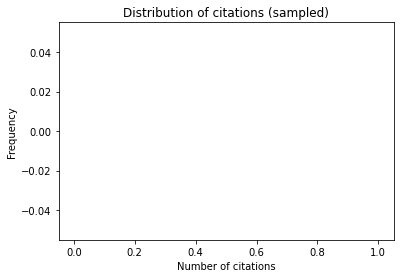

Ploting n_citation Done
Droping the ISSN column Done
Keeping only academic publications Done
Type of publication Done
Exploding the authors column Done
Adding the gender column to the author Done
Normalizing the field of study column Done
Computing the H-Index of Authors Done
Computing the H-Index of Organizations Done
Computing the H-Index of Journals Done
Transformations finished.
Updating the delta tables...
Starting delta tables updates...
Updating the delta table of Authors Dimension...
Done for Authors Dimension
Updating the delta table of Venues Dimension...
Done for Venues Dimension
Updating the delta table of Organization Dimension...
Done for Organization Dimension
Updating the delta table of Publication Dimension...
Done for Publication Dimension
Updating the delta table of Date Dimension...
Done for Date Dimension
Updating the delta table of FOS Dimension...
Done for FOS Dimension
Updating the delta table of Keyword Dimension...
Done for Keyword Dimension
Updating the delta

In [0]:
# We should load another split of the data, apply the same transformations as the `initial` split,
# then extracting and loading the data into the `delta` tables that we made before but without `append.
# ===============================================================================================================================
# In the this cell, the inUpdate() method will be called, to read using spark streaming data splits from `/tables/streamingData/*`
# directory, then for each df, the etl() will be called to apply the transformations on the df, then the deltaUpdate() method will
# be called to update all dimensions in delta/ with the new data file (df).


from delta.tables import DeltaTable

def etl(df):
    # 1. Data Partitioning
    print("Partitions of the df : {0:,}".format(df.rdd.getNumPartitions()))
    df = df.repartition(4)
    print("Partitions of the df : {0:,}".format(df.rdd.getNumPartitions()))
    print('Data Partitioning Done')
    # 2. Dropping publications with one word title, and empty authors
    df = df.filter((size(split(df['title'], ' ')) != 1) & (size(df['authors']) != 0))
    print('Dropping publications with one word title and empty authors Done')
    # 3. Ploting n_citation
    sampled_df = df.sample(fraction=0.1, seed=42)
    citations = [int(c) for c in sampled_df.select('n_citation').rdd.flatMap(lambda x: x).collect() if c is not None]
    plt.hist(citations, bins=30)
    plt.xlabel('Number of citations')
    plt.ylabel('Frequency')
    plt.title('Distribution of citations (sampled)')
    plt.show()
    print('Ploting n_citation Done')
    # 4. Droping the ISSN column
    df = df.drop(col('ISSN'))
    print('Droping the ISSN column Done')
    # 5. Keeping only academic publications
    exclude_keywords = ["foreword", "preface", "editorial", "introduction", "special issue", "proceedings"]
    df = df.filter(~lower(col("title")).rlike("|".join(exclude_keywords)))
    print('Keeping only academic publications Done')
    # 6. Type of publication
    df = df.withColumn("typeOfPublication", when(col("venue.raw").rlike("@"), "workshop").otherwise("conference"))
    df = df.withColumn("typeOfPublication", when(col("volume").isNotNull() | col("issue").isNotNull(), "journal").otherwise("conference"))
    print('Type of publication Done')
    # 7. Exploding the authors column
    df = df.select(explode('authors').alias("author"), col('*'))
    print('Exploding the authors column Done')
    # 8. Adding the gender column to the author
    df = df.withColumn('author', authorGenderUDF(col("author")))
    print('Adding the gender column to the author Done')
    # 9. Normalizing the field of study column
    df = df.withColumn('fos', fosUDF(col("fos")))
    print('Normalizing the field of study column Done')
    # 10. Computing the H-Index of Authors
    window_1  = Window.partitionBy("author.name").orderBy(col("n_citation").desc())
    df = H_index(df, window_1, "Author_H_index")
    print('Computing the H-Index of Authors Done')
    # 11. Computing the H-Index of Organizations
    window_1 = Window.partitionBy("author.org").orderBy(col("n_citation").desc())
    df = H_index(df, window_1, "Org_H_index")
    print('Computing the H-Index of Organizations Done')
    # 12. Computing the H-Index of Journals
    window_1  = Window.partitionBy("venue.raw").orderBy(col("n_citation").desc())
    df = H_index(df, window_1, "Jor_H_index")
    print('Computing the H-Index of Journals Done')
    return df

def deltaUpdate(df_inc_stream_updated):
    # Reading the existing delta tables of dimensions & fact table
    print('Starting delta tables updates...')
    dt_authorsDim = DeltaTable.forPath(spark, "dbfs:/delta/authorsDim/")
    dt_dateDim = DeltaTable.forPath(spark, "dbfs:/delta/dateDim/")
    dt_fosDim = DeltaTable.forPath(spark, "dbfs:/delta/fosDim/")
    dt_keywordDim = DeltaTable.forPath(spark, "dbfs:/delta/keywordDim/")
    dt_languageDim = DeltaTable.forPath(spark, "dbfs:/delta/languageDim/")
    dt_organizationDim = DeltaTable.forPath(spark, "dbfs:/delta/organizationDim/")
    dt_pubicationDim = DeltaTable.forPath(spark, "dbfs:/delta/pubicationDim/")
    dt_typeDim = DeltaTable.forPath(spark, "dbfs:/delta/typeDim/")
    dt_venuesDim = DeltaTable.forPath(spark, "dbfs:/delta/venuesDim/")
    dt_factTable = DeltaTable.forPath(spark, "dbfs:/delta/factTable/")
    print('Updating the delta table of Authors Dimension...')
    df_inc_stream_updated_authorsDim = df_inc_stream_updated \
        .withColumn("h-index", df_inc_stream_updated["Author_H_index"]) \
        .withColumn("author_id", df_inc_stream_updated["author"].getItem("_id")) \
        .withColumn("author_first_name", when(col('author.name').isNotNull(), split(col('author.name'), '\s+')).getItem(0)) \
        .withColumn("author_last_name", when(col('author.name').isNotNull(), split(col('author.name'), '\s+')).getItem(1))
    dt_authorsDim.alias("target") \
        .merge(df_inc_stream_updated_authorsDim.select(['h-index', 'author_id', 'author_first_name', 'author_last_name']).alias("source"), "target.author_id = source.author_id") \
        .whenMatchedUpdateAll() \
        .whenNotMatchedInsertAll() \
        .execute()
    print('Done for Authors Dimension')
    print('Updating the delta table of Venues Dimension...')
    df_inc_stream_updated_venuesDim = df_inc_stream_updated \
        .withColumn("venue_id", df_inc_stream_updated["venue"].getItem("_id")) \
        .withColumn("venue_name", df_inc_stream_updated["venue"].getItem("raw"))
    dt_venuesDim.alias("target") \
        .merge(df_inc_stream_updated_venuesDim.select(['venue_id', 'venue_name']).alias("source"), "target.venue_id = source.venue_id") \
        .whenMatchedUpdateAll() \
        .whenNotMatchedInsertAll() \
        .execute()
    print('Done for Venues Dimension')
    print('Updating the delta table of Organization Dimension...')
    df_inc_stream_updated_organizationDim = df_inc_stream_updated \
        .withColumn("organization_id", df_inc_stream_updated["author"].getItem("orgid")) \
        .withColumn("organization_name", df_inc_stream_updated["author"].getItem("org"))
    dt_organizationDim.alias("target") \
        .merge(df_inc_stream_updated_organizationDim.select(['organization_id', 'organization_name']).alias("source"), "target.organization_id = source.organization_id") \
        .whenMatchedUpdateAll() \
        .whenNotMatchedInsertAll() \
        .execute()
    print('Done for Organization Dimension')
    print('Updating the delta table of Publication Dimension...')
    df_inc_stream_updated_publicationDim = df_inc_stream_updated \
        .withColumn("publication_id", df_inc_stream_updated["_id"]) \
        .withColumn("publication_title", df_inc_stream_updated["title"]) \
        .withColumn("publication_volume", df_inc_stream_updated["volume"]) \
        .withColumn("publication_numberOfCitations", df_inc_stream_updated["n_citation"])
    dt_pubicationDim.alias("target") \
        .merge(df_inc_stream_updated_publicationDim.select(['publication_id', 'publication_title', 'publication_volume', 'publication_numberOfCitations']).alias("source"), "target.publication_id = source.publication_id") \
        .whenMatchedUpdateAll() \
        .whenNotMatchedInsertAll() \
        .execute()
    print('Done for Publication Dimension')
    print('Updating the delta table of Date Dimension...')
    df_inc_stream_updated_dateDim = df_inc_stream_updated \
        .withColumn("date_id", monotonically_increasing_id())\
        .withColumn("year", df_inc_stream_updated["year"])
    dt_dateDim.alias("target") \
        .merge(df_inc_stream_updated_dateDim.select(['date_id', 'year']).alias("source"), "target.date_id = source.date_id") \
        .whenMatchedUpdateAll() \
        .whenNotMatchedInsertAll() \
        .execute()
    print('Done for Date Dimension')
    print('Updating the delta table of FOS Dimension...')
    df_inc_stream_updated_fosDim = df_inc_stream_updated \
        .withColumn("fos_id", monotonically_increasing_id())\
        .withColumn("fos_text", df_inc_stream_updated["fos"])
    dt_fosDim.alias("target") \
        .merge(df_inc_stream_updated_fosDim.select(['fos_id', 'fos_text']).alias("source"), "target.fos_id = source.fos_id") \
        .whenMatchedUpdateAll() \
        .whenNotMatchedInsertAll() \
        .execute()
    print('Done for FOS Dimension')
    print('Updating the delta table of Keyword Dimension...')
    df_inc_stream_updated_keywordDim = df_inc_stream_updated \
        .withColumn("keyword_id", monotonically_increasing_id())\
        .withColumn("keyword_text", df_inc_stream_updated["keywords"])
    dt_keywordDim.alias("target") \
        .merge(df_inc_stream_updated_keywordDim.select(['keyword_id', 'keyword_text']).alias("source"), "target.keyword_id = source.keyword_id") \
        .whenMatchedUpdateAll() \
        .whenNotMatchedInsertAll() \
        .execute()
    print('Done for Keyword Dimension')
    print('Updating the delta table of Language Dimension...')
    df_inc_stream_updated_languageDim = df_inc_stream_updated \
        .withColumn("language_id", monotonically_increasing_id())\
        .withColumn("language_text", df_inc_stream_updated["lang"])
    dt_languageDim.alias("target") \
        .merge(df_inc_stream_updated_languageDim.select(['language_id', 'language_text']).alias("source"), "target.language_id = source.language_id") \
        .whenMatchedUpdateAll() \
        .whenNotMatchedInsertAll() \
        .execute()
    print('Done for Language Dimension')
    print('Updating the delta table of Type Dimension...')
    df_inc_stream_updated_typeDim = df_inc_stream_updated \
        .withColumn("type_id", monotonically_increasing_id())\
        .withColumn("top_description", df_inc_stream_updated["typeOfPublication"])
    dt_typeDim.alias("target") \
        .merge(df_inc_stream_updated_typeDim.select(['type_id', 'top_description']).alias("source"), "target.type_id = source.type_id") \
        .whenMatchedUpdateAll() \
        .whenNotMatchedInsertAll() \
        .execute()
    print('Done for Type Dimension')
    print('Updating the delta table of the fact table by overwritting it with the new dimensions...')
    factTable = df\
    .join(dateDim, dateDim.year == df.year, "inner")\
    .join(keywordDim, keywordDim.keyword_text == df.keywords, "inner")\
    .join(fosDim, fosDim.fos_text == df.fos, "inner")\
    .join(languageDim, languageDim.language_text == df.lang , "inner")\
    .join(typeDim, typeDim.top_description == df.typeOfPublication, "inner")\
    .select(
        col('date_id'),
        col('keyword_id'),
        col('type_id'),
        col('_id').alias('publication_id'),
        col('venue._id').alias('venue_id'),
        col('fos_id'),
        col('author.orgid').alias('org_id'),
        col('author._id').alias('author_id'),
        col('language_id'),
    ).dropDuplicates()\
      .where(col('author_id').isNotNull())\
      .where(col('org_id').isNotNull())\
      .where(col('venue_id').isNotNull())\
    .write.format("delta").mode("overwrite").save("/delta/factTable/")
    print('Done for the Fact Table')
    print('Update delta tables done.')
    
def incrementalUpdate():
    print('Running ETL for an incremental update...')
    # We we should use the spark streaming feature to read some splits from a folder
    # and for each split, run the etl() method on it then send it to deltaUpdate() method to update the delta tables.
    print('Starting data reading...')
    # Defining the schema
    from pyspark.sql.types import StructType, StructField, StringType, ArrayType, LongType
    Dataschema = StructType([
        StructField("_id", StringType(), True),
        StructField("abstract", StringType(), True),
        StructField("authors", ArrayType(
            StructType([
                StructField("_id", StringType(), True),
                StructField("bio", StringType(), True),
                StructField("email", StringType(), True),
                StructField("gid", StringType(), True),
                StructField("name", StringType(), True),
                StructField("name_zh", StringType(), True),
                StructField("oid", StringType(), True),
                StructField("oid_zh", StringType(), True),
                StructField("orcid", StringType(), True),
                StructField("org", StringType(), True),
                StructField("org_zh", StringType(), True),
                StructField("orgid", StringType(), True),
                StructField("orgs", ArrayType(StringType(), True), True),
                StructField("sid", StringType(), True)
            ])
        ), True),
        StructField("doi", StringType(), True),
        StructField("fos", ArrayType(StringType(), True), True),
        StructField("isbn", StringType(), True),
        StructField("issn", StringType(), True),
        StructField("issue", StringType(), True),
        StructField("keywords", ArrayType(StringType(), True), True),
        StructField("lang", StringType(), True),
        StructField("n_citation", LongType(), True),
        StructField("page_end", StringType(), True),
        StructField("page_start", StringType(), True),
        StructField("pdf", StringType(), True),
        StructField("references", ArrayType(StringType(), True), True),
        StructField("title", StringType(), True),
        StructField("url", ArrayType(StringType(), True), True),
        StructField("venue", StructType([
            StructField("_id", StringType(), True),
            StructField("issn", StringType(), True),
            StructField("name", StringType(), True),
            StructField("name_d", StringType(), True),
            StructField("name_s", StringType(), True),
            StructField("online_issn", StringType(), True),
            StructField("publisher", StringType(), True),
            StructField("raw", StringType(), True),
            StructField("raw_zh", StringType(), True),
            StructField("sid", StringType(), True),
            StructField("src", StringType(), True),
            StructField("t", StringType(), True),
            StructField("type", LongType(), True)
        ]), True),
        StructField("volume", StringType(), True),
        StructField("year", LongType(), True)
    ])
    # Streaming START
    df_inc_stream = spark.readStream \
    .option("inferSchema", "false") \
    .option("multiline","true") \
    .option("maxFilesPerTrigger", 1) \
    .schema(Dataschema)\
    .json("dbfs:/FileStore/tables/streamingData/*")
    print('Data reading done.')
    query = df_inc_stream.writeStream \
    .outputMode("append") \
    .format("json") \
    .option("path", "dbfs:/FileStore/tables/output_dir/") \
    .option("checkpointLocation", "dbfs:/FileStore/tables/checkpoint_dir/") \
    .start()
    query.awaitTermination(5)
    query.stop()
    # Read the data from the streaming sink into a DataFrame
    df_inc_stream_output = spark.read.format("json").schema(Dataschema).load("dbfs:/FileStore/tables/output_dir/")
    # Streaming END
    df_inc_stream_updated = etl(df_inc_stream_output)
    print('Transformations finished.')
    print('Updating the delta tables...')
    deltaUpdate(df_inc_stream_updated)
    print('Delta tables udated successfully.')
    print('Incremental update is done successfully.')
    print('Closing...')
    print('Done')
    
# Running the incremental updated to our data warehouse...
incrementalUpdate()

### Queries

In [0]:
# Query:
# Selecting the H_Index of each author, h_index ordered desc.
# For specific fos, i.e. = `Computer Science`
display(factTable.join(authorsDim, "author_id", "inner")\
.join(fosDim, "fos_id")\
.where(fosDim.fos_text == "Computer Science")\
.orderBy(col("h-index").desc())\
.select(
    col('author_id'),
    col('author_first_name').alias("firstName"),
    col('author_last_name').alias("lastName"),
    col("h-index"),
    col("fos_text").alias("fos"),
))

author_id,firstName,lastName,h-index,fos
5448ebcbdabfae87b7e953ca,Hans-Peter,Seidel,2,Computer Science
53f42db3dabfaec22ba1c1a0,Liangjie,Hong,1,Computer Science
5434bc64dabfaebba585dd09,Mérouane,Debbah,1,Computer Science
5630a35645cedb3399af4a03,Bart,Dhoedt,1,Computer Science
5448dbe3dabfae87b7e8858c,Athena,Vakali,1,Computer Science
53f43aa6dabfaee2a1d0f6ae,Philipp,Jenke,1,Computer Science
53f3839ddabfae4b34a04de3,Bart,De,1,Computer Science
53f64e31dabfae6a71b6029f,David,B.,1,Computer Science
53f4b434dabfaedce5648757,Martin,Bokeloh,1,Computer Science
53f4338bdabfaee43ec12a01,M.-T.,Schmidt,1,Computer Science
